In [1]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt



### Notes
#### Offset: 
- When combining both types of trailers, anterior insula shows a significant positive correlation with negative arousal (r=0.17489; p-value=1.7246341016483672e-06). Also, anterior insual shows a negative correlation with watch scores (r=-0.07491; p-value=0.04175856809627057).
- For horror trailers alone, NAcc has a significant positive correlation with positive arousal (r=0.15077; p-value= 0.003743392014030906); AIns has a significant positive correlation with negative arousal (r=0.13562; p-value=0.009192194315207748). 
- For comedy trailers alone, NAcc has a significant negative correlation with positive arousal (r=-0.11963; p-value=0.021179442433856898). Also, NAcc is negatively correlated with watch scores (r=0.10155; p-value=0.050637663806451946).
#### Positive peak: 
- When combining both trailers, the positive peak of AIns is positively correlated with negative arousal (r=0.092; p-value=0.01235140998911575)
#### Negative peak: 


- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Get peak, above 1 std above zero.
- Reality check with V1 for all subjects.


# Homemade functions

In [2]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [3]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [4]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [5]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

# Clean data

In [6]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [7]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
all_subs_events_df.shape

(868, 50)

In [8]:
# Drop outliers from positive arousal. 
print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from negative arousal.
all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from watch score.

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.8]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -1.1]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)





The shape of the dataframe before dropping outliers is:  (868, 50)
The shape of the dataframe after dropping 'positive arousal' outliers is:  (866, 50)
The shape of the dataframe after dropping 'negative arousal' outliers is:  (865, 50)
The shape of the dataframe after dropping 'NAcc' outliers is:  (860, 50)
The shape of the dataframe after dropping 'AIns' outliers is:  (858, 50)


In [9]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.8375 with a p-value of: 7.198386040044137e-227
The correlation between W_score and Neg_arousal is: -0.6622 with a p-value of: 2.2156826636114515e-109


Text(-0.8, -2, 'r= -0.6622; p-value: 2.2156826636114515e-109')

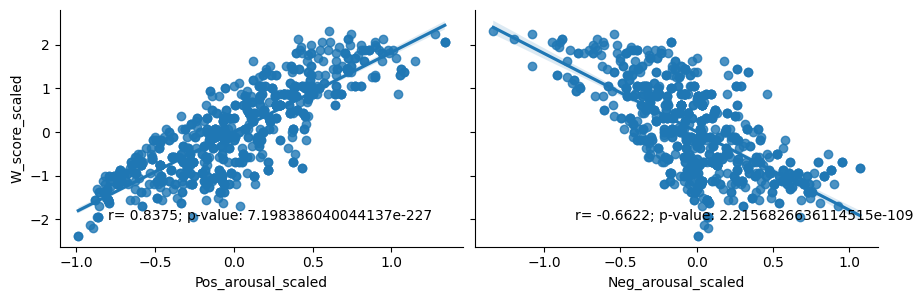

In [10]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

W_PA_NA_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    height=3,
    aspect=1.5)

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 0].text(s=W_PA_string, x=-.8, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 1].text(s=W_NA_string, x=-.8, y=-2, fontsize=10)


In [11]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between A_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between A_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: -0.685 with a p-value of: 5.5499718805918835e-61
The correlation between A_score and Pos_arousal for comedy trailers is: -0.685 with a p-value of: 5.5499718805918835e-61

The correlation between W_score and Pos_arousal for horror trailers is: -0.6373 with a p-value of: 4.880976487737005e-50
The correlation between A_score and Pos_arousal for horror trailers is: -0.6373 with a p-value of: 4.880976487737005e-50


Text(-0.8, -2.5, 'H r= -0.6373; p-value: 4.880976487737005e-50')

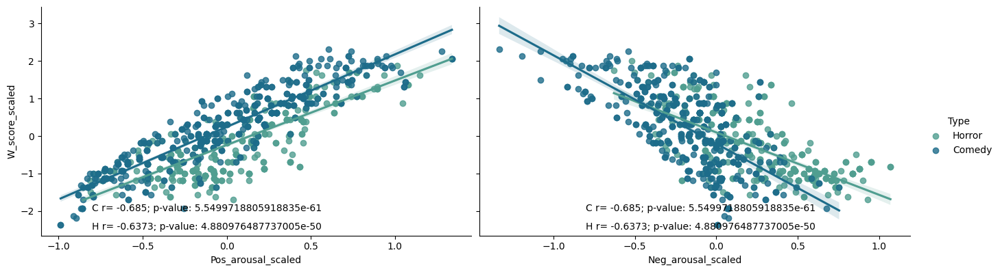

In [12]:
W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    hue="Type",
    height=4,
    aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

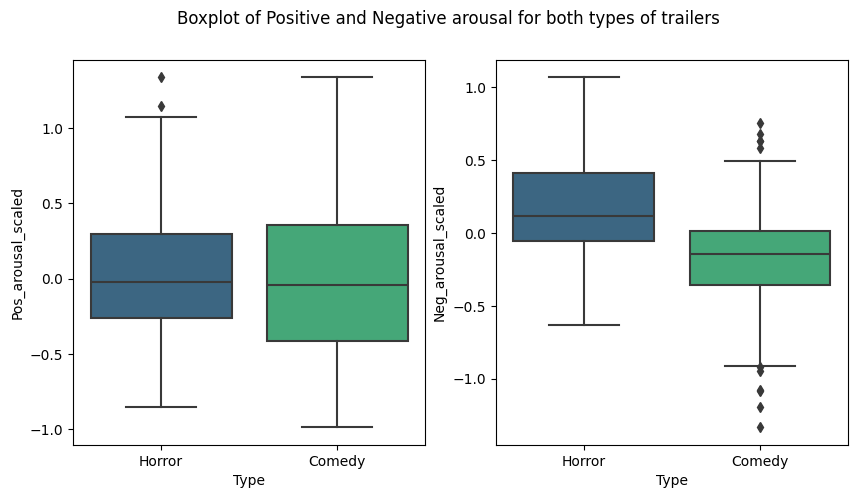

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

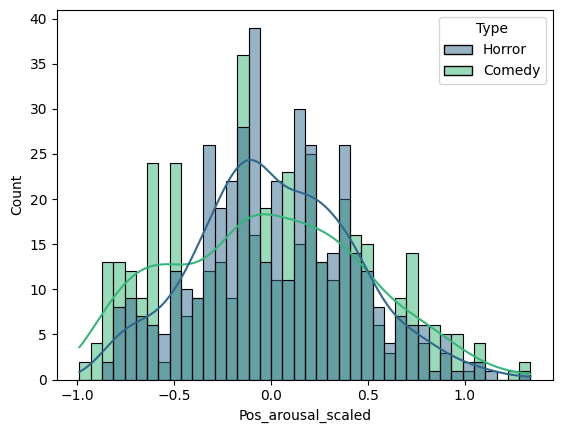

In [14]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)
#sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='W_score_scaled', ylabel='Count'>

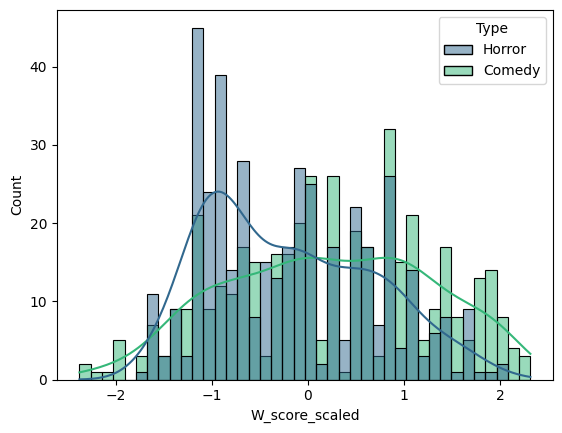

In [15]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_1943/3263024937.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")


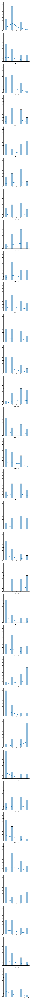

In [16]:
sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

In [17]:
# Correlation with Positive Arousal. 
NAcc_PA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores. 
NAcc_W_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["W_score_scaled"])
AIns_W_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["W_score_scaled"])
MPFC_W_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_All_corr[1])))


For both types of trailers, the correlation between NAcc whole activation and positive arousal is: 0.00076 with a p-value of: 0.9822964549369141
For both types of trailers, the correlation between AIns whole activation and positive arousal is: 0.01694 with a p-value of: 0.620197384707899
For both types of trailers, the correlation between MPFC whole activation and positive arousal is: -0.07719 with a p-value of: 0.023752258751642226

For both types of trailers, the correlation between NAcc whole activation and negative arousal is: 0.03319 with a p-value of: 0.3315317359058229
For both types of trailers, the correlation between AIns whole activation and negative arousal is: 0.17467 with a p-value of: 2.6257101302823465e-07
For both types of trailers, the correlation between MPFC whole activation and negative arousal is: -0.02072 with a p-value of: 0.5444341017050237

For both types of trailers, the correlation between NAcc whole activation and watch scores is: -0.0112 with a p-value of:

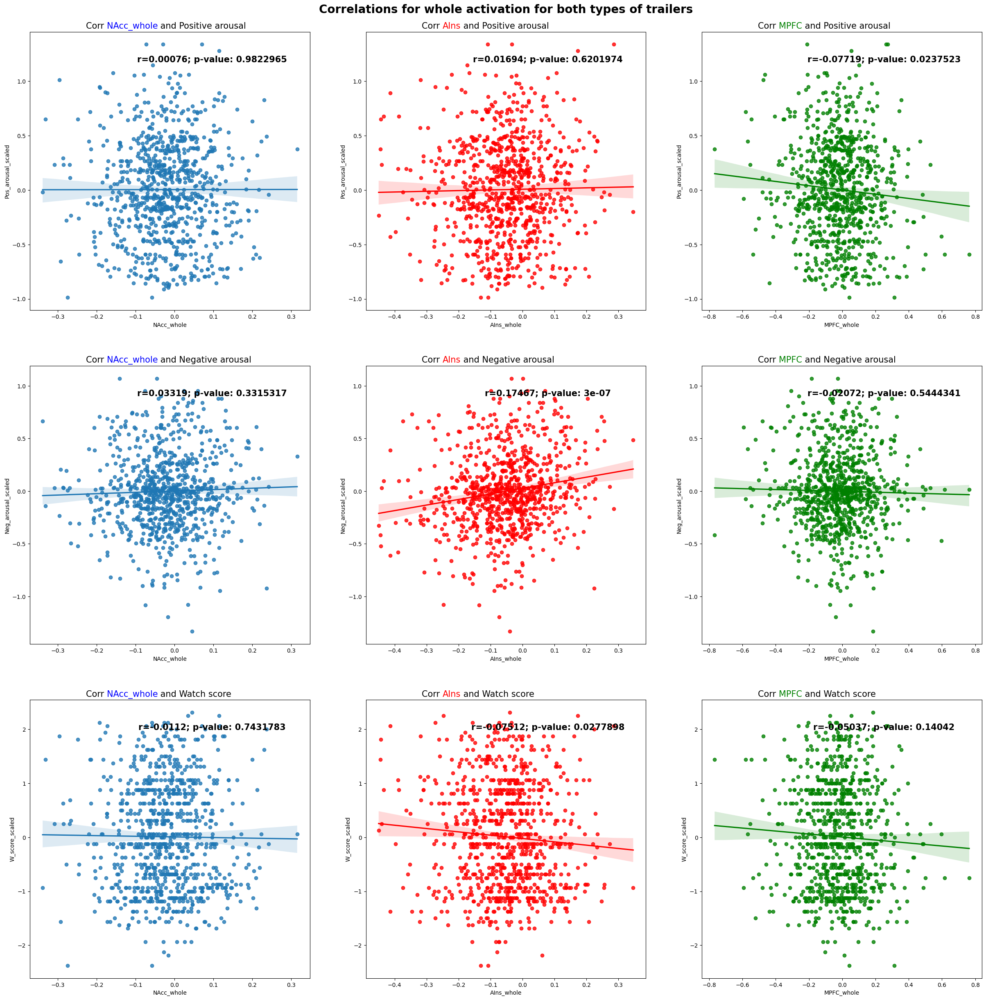

In [18]:
whole_all_corr = [NAcc_PA_whole_All_corr, NAcc_NA_whole_All_corr, NAcc_W_whole_All_corr, AIns_PA_whole_All_corr, AIns_NA_whole_All_corr, AIns_W_whole_All_corr, MPFC_PA_whole_All_corr, MPFC_NA_whole_All_corr, MPFC_W_whole_All_corr]

plot_correlations(all_subs_events_df, whole_all_corr, "whole", "Correlations for whole activation for both types of trailers")

In [19]:
# Whole Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["W_score_scaled"])
AIns_W_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_C_corr[1])))
      
      

For comedy trailers, the correlation between NAcc whole activation and positive arousal is: -0.03022 with a p-value of: 0.5315065451165499
For comedy trailers, the correlation between AIns whole activation and positive arousal is: -0.02324 with a p-value of: 0.6304775097544776
For comedy trailers, the correlation between MPFC whole activation and positive arousal is: -0.10976 with a p-value of: 0.022676286979715854

For comedy trailers, the correlation between NAcc whole activation and negative arousal is: 0.02413 with a p-value of: 0.6173259325309133
For comedy trailers, the correlation between AIns whole activation and negative arousal is: 0.10204 with a p-value of: 0.03419851575258531
For comedy trailers, the correlation between MPFC whole activation and negative arousal is: 0.0157 with a p-value of: 0.7452001172148403

For comedy trailers, the correlation between NAcc whole activation and watch scores is: -0.03147 with a p-value of: 0.5146291999400427
For comedy trailers, the corre

In [20]:
# Whole Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["W_score_scaled"])
AIns_W_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["W_score_scaled"])
MPFC_W_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_H_corr[1])))



For horror trailers, the correlation between NAcc whole activation and positive arousal is: 0.03694 with a p-value of: 0.44640784963936464
For horror trailers, the correlation between AIns whole activation and positive arousal is: 0.04532 with a p-value of: 0.35022677657116197
For horror trailers, the correlation between MPFC whole activation and positive arousal is: -0.03409 with a p-value of: 0.48228146738189065

For horror trailers, the correlation between NAcc whole activation and negative arousal is: 0.03796 with a p-value of: 0.43402847993782995
For horror trailers, the correlation between AIns whole activation and negative arousal is: 0.06535 with a p-value of: 0.17770682969332757
For horror trailers, the correlation between MPFC whole activation and negative arousal is: -0.04636 with a p-value of: 0.33922697024006493

For horror trailers, the correlation between NAcc whole activation and watch scores is: 0.01797 with a p-value of: 0.7111263230082603
For horror trailers, the cor

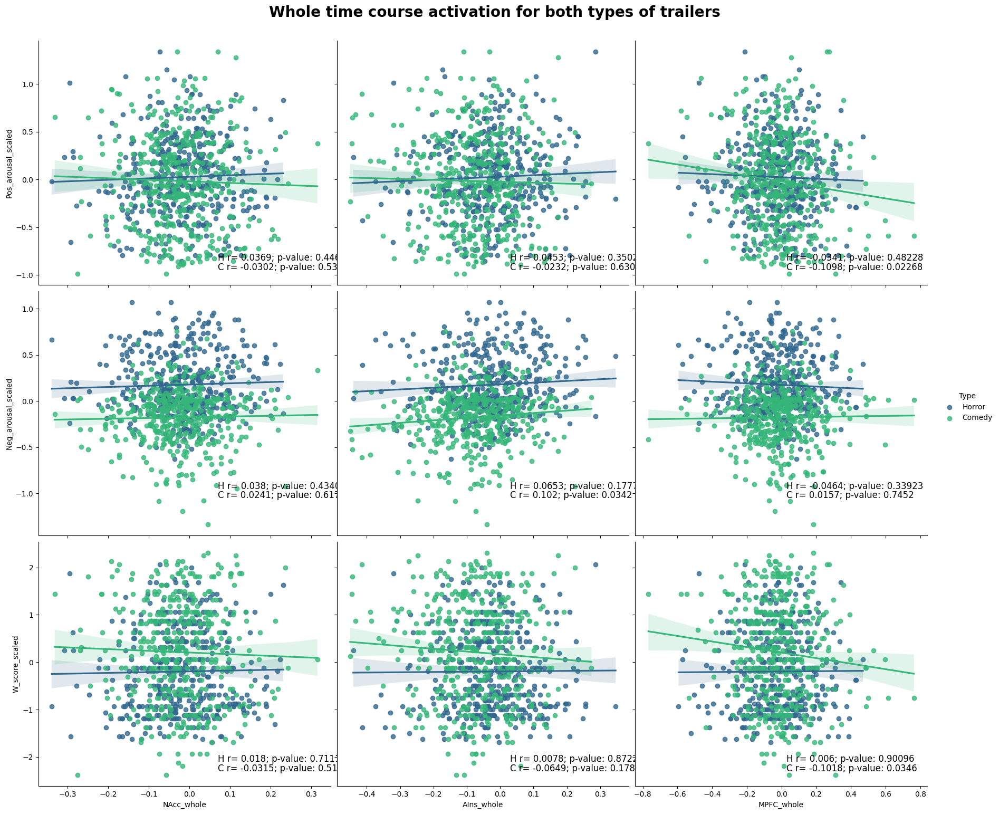

In [21]:
whole_comedy_corr = [NAcc_PA_whole_C_corr, NAcc_NA_whole_C_corr, NAcc_W_whole_C_corr, AIns_PA_whole_C_corr, AIns_NA_whole_C_corr, AIns_W_whole_C_corr, MPFC_PA_whole_C_corr, MPFC_NA_whole_C_corr, MPFC_W_whole_C_corr]
whole_horror_corr = [NAcc_PA_whole_H_corr, NAcc_NA_whole_H_corr, NAcc_W_whole_H_corr, AIns_PA_whole_H_corr, AIns_NA_whole_H_corr, AIns_W_whole_H_corr, MPFC_PA_whole_H_corr, MPFC_NA_whole_H_corr, MPFC_W_whole_H_corr]

title_whole = 'Whole time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "whole", whole_comedy_corr, whole_horror_corr, title_whole)

## Neural Activation Offset 

In [22]:
# Correlation with Positive Arousal. 
NAcc_PA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["W_score_scaled"])
AIns_W_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["W_score_scaled"])
MPFC_W_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_All_corr[1])))

For both types of trailers, the correlation between NAcc offset activation and positive arousal is: 0.00048 with a p-value of: 0.9889087081954485
For both types of trailers, the correlation between AIns offset activation and positive arousal is: 0.00324 with a p-value of: 0.9245924682015422
For both types of trailers, the correlation between MPFC offset activation and positive arousal is: -0.04144 with a p-value of: 0.2252664944138932

For both types of trailers, the correlation between NAcc offset activation and negative arousal is: 0.0254 with a p-value of: 0.4573953671242434
For both types of trailers, the correlation between AIns offset activation and negative arousal is: 0.18004 with a p-value of: 1.0995603979429013e-07
For both types of trailers, the correlation between MPFC offset activation and negative arousal is: 0.03095 with a p-value of: 0.3652670904710868

For both types of trailers, the correlation between NAcc offset activation and watch scores is: -0.01761 with a p-valu

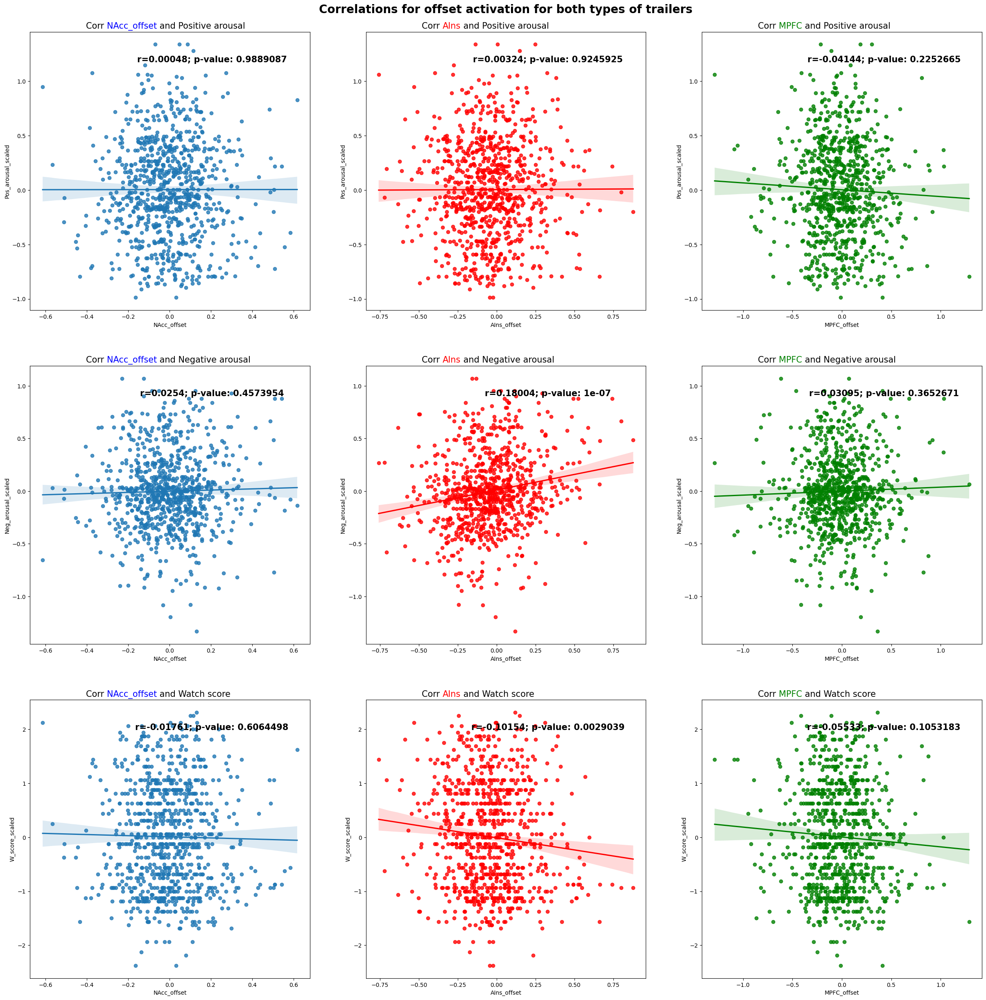

In [23]:
offset_all_corr = [NAcc_PA_Off_All_corr, NAcc_NA_Off_All_corr, NAcc_W_Off_All_corr, AIns_PA_Off_All_corr, AIns_NA_Off_All_corr, AIns_W_Off_All_corr, MPFC_PA_Off_All_corr, MPFC_NA_Off_All_corr, MPFC_W_Off_All_corr]
plot_correlations(all_subs_events_df, offset_all_corr, "offset", "Correlations for offset activation for both types of trailers")

In [24]:
# Offset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_C_corr[1])))
      

For comedy trailers, the correlation between NAcc offset activation and positive arousal is: -0.0933 with a p-value of: 0.052911336098456815
For comedy trailers, the correlation between AIns offset activation and positive arousal is: -0.05421 with a p-value of: 0.2614096415125765
For comedy trailers, the correlation between MPFC offset activation and positive arousal is: -0.08597 with a p-value of: 0.0745859778159443

For comedy trailers, the correlation between NAcc offset activation and negative arousal is: 0.01331 with a p-value of: 0.7829539337292849
For comedy trailers, the correlation between AIns offset activation and negative arousal is: 0.09098 with a p-value of: 0.059124049270407944
For comedy trailers, the correlation between MPFC offset activation and negative arousal is: 0.01743 with a p-value of: 0.7182445900655324

For comedy trailers, the correlation between NAcc offset activation and watch scores is: -0.08297 with a p-value of: 0.08535907296526427
For comedy trailers, 

In [25]:
# Offset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["W_score_scaled"])
AIns_W_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_H_corr[1])))

For horror trailers, the correlation between NAcc offset activation and positive arousal is: 0.10564 with a p-value of: 0.029068532945376174
For horror trailers, the correlation between AIns offset activation and positive arousal is: 0.0489 with a p-value of: 0.31337529958264493
For horror trailers, the correlation between MPFC offset activation and positive arousal is: 0.00903 with a p-value of: 0.8524792104268119

For horror trailers, the correlation between NAcc offset activation and negative arousal is: 0.03198 with a p-value of: 0.5098404830022183
For horror trailers, the correlation between AIns offset activation and negative arousal is: 0.13976 with a p-value of: 0.0038064232041487896
For horror trailers, the correlation between MPFC offset activation and negative arousal is: 0.01609 with a p-value of: 0.7401872911678277

For horror trailers, the correlation between NAcc offset activation and watch scores is: 0.05934 with a p-value of: 0.22109533863400574
For horror trailers, th

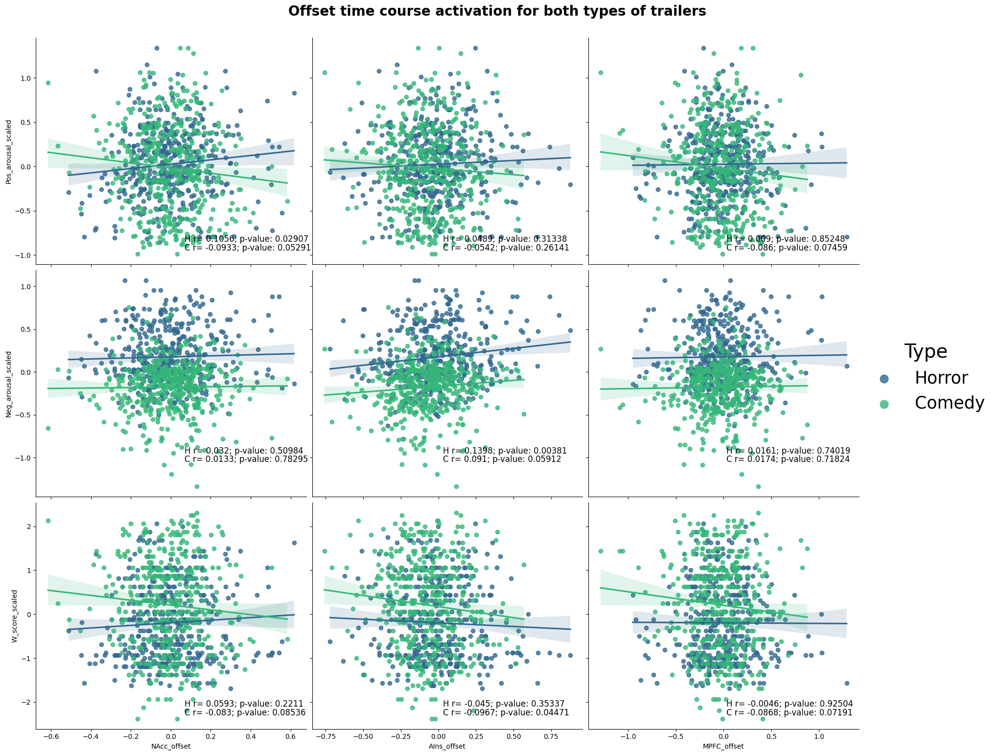

In [26]:
offset_horror_corr = [NAcc_PA_Off_H_corr, NAcc_NA_Off_H_corr, NAcc_W_Off_H_corr, AIns_PA_Off_H_corr, AIns_NA_Off_H_corr, AIns_W_Off_H_corr, MPFC_PA_Off_H_corr, MPFC_NA_Off_H_corr, MPFC_W_Off_H_corr]
offset_comedy_corr = [NAcc_PA_Off_C_corr, NAcc_NA_Off_C_corr, NAcc_W_Off_C_corr, AIns_PA_Off_C_corr, AIns_NA_Off_C_corr, AIns_W_Off_C_corr, MPFC_PA_Off_C_corr, MPFC_NA_Off_C_corr, MPFC_W_Off_C_corr]

title_offset = 'Offset time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "offset", offset_comedy_corr, offset_horror_corr, title_offset)


# Neural activation middle

In [27]:
# Correlation with Positive Arousal.
NAcc_PA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["W_score_scaled"])
AIns_W_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["W_score_scaled"])
MPFC_W_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_All_corr[1])))
      


For both types of trailers, the correlation between NAcc middle activation and positive arousal is: -0.01157 with a p-value of: 0.7350690214916925
For both types of trailers, the correlation between AIns middle activation and positive arousal is: -0.01272 with a p-value of: 0.7098728128678544
For both types of trailers, the correlation between MPFC middle activation and positive arousal is: -0.1178 with a p-value of: 0.0005449698196029448

For both types of trailers, the correlation between NAcc middle activation and negative arousal is: 0.02521 with a p-value of: 0.46074137974184715
For both types of trailers, the correlation between AIns middle activation and negative arousal is: 0.09839 with a p-value of: 0.003915463764694267
For both types of trailers, the correlation between MPFC middle activation and negative arousal is: -0.04439 with a p-value of: 0.19390095642234492

For both types of trailers, the correlation between NAcc middle activation and watch scores is: -0.00965 with a 

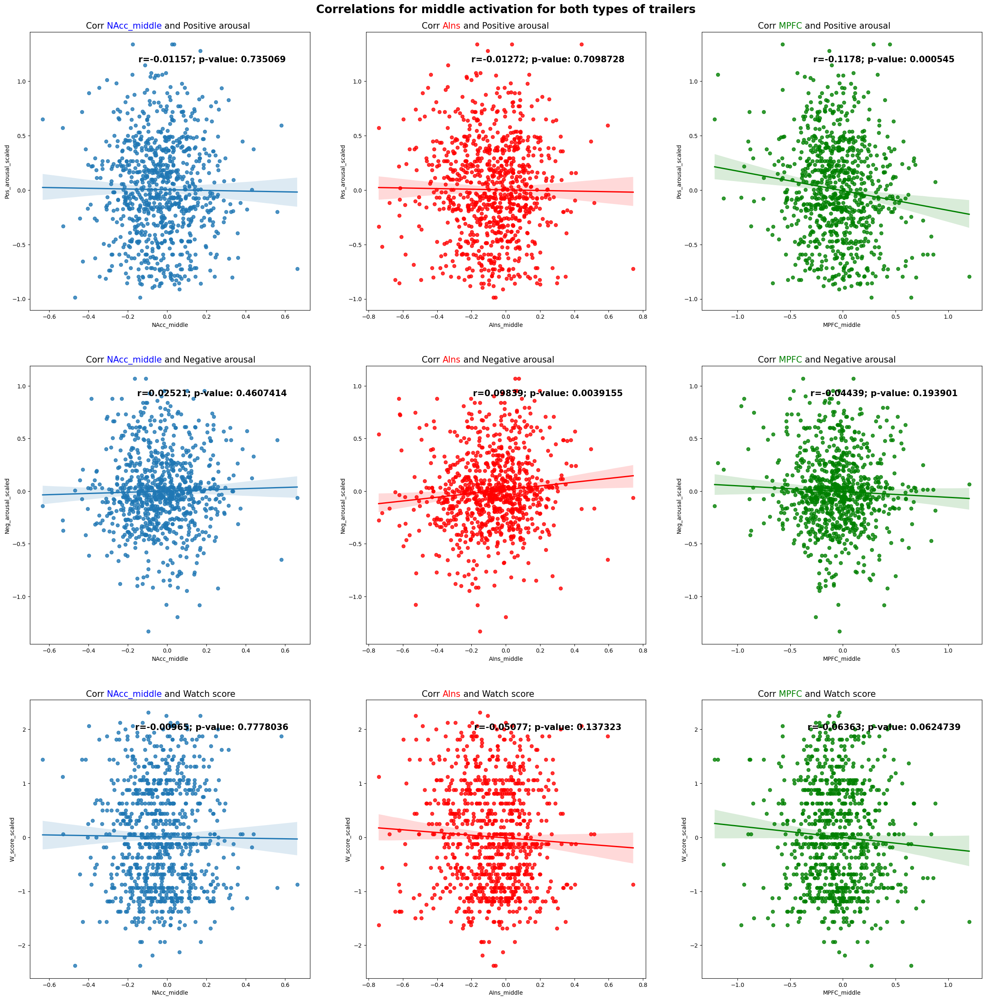

In [28]:
Mid_all_corr = [NAcc_PA_Mid_All_corr, NAcc_NA_Mid_All_corr, NAcc_W_Mid_All_corr, AIns_PA_Mid_All_corr, AIns_NA_Mid_All_corr, AIns_W_Mid_All_corr, MPFC_PA_Mid_All_corr, MPFC_NA_Mid_All_corr, MPFC_W_Mid_All_corr]
plot_correlations(all_subs_events_df, Mid_all_corr, "middle", "Correlations for middle activation for both types of trailers")

In [29]:
# Middle Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_C_corr[1])))


For comedy trailers, the correlation between NAcc middle activation and positive arousal is: -0.01873 with a p-value of: 0.6982428259182855
For comedy trailers, the correlation between AIns middle activation and positive arousal is: -0.04106 with a p-value of: 0.3951755947861901
For comedy trailers, the correlation between MPFC middle activation and positive arousal is: -0.11978 with a p-value of: 0.012832391422587795

For comedy trailers, the correlation between NAcc middle activation and negative arousal is: 0.00509 with a p-value of: 0.9160403558364287
For comedy trailers, the correlation between AIns middle activation and negative arousal is: 0.06499 with a p-value of: 0.17809689370253706
For comedy trailers, the correlation between MPFC middle activation and negative arousal is: -0.01796 with a p-value of: 0.7100375757698825

For comedy trailers, the correlation between NAcc middle activation and watch scores is: -0.00751 with a p-value of: 0.876498347133285
For comedy trailers, t

In [30]:
# Middle Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["W_score_scaled"])
AIns_W_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_H_corr[1])))

For horror trailers, the correlation between NAcc middle activation and positive arousal is: -0.00443 with a p-value of: 0.9272134986592727
For horror trailers, the correlation between AIns middle activation and positive arousal is: 0.00677 with a p-value of: 0.8891394193660367
For horror trailers, the correlation between MPFC middle activation and positive arousal is: -0.11631 with a p-value of: 0.016189540454954597

For horror trailers, the correlation between NAcc middle activation and negative arousal is: 0.03256 with a p-value of: 0.5021639888218764
For horror trailers, the correlation between AIns middle activation and negative arousal is: -0.00717 with a p-value of: 0.8825402458776259
For horror trailers, the correlation between MPFC middle activation and negative arousal is: -0.06818 with a p-value of: 0.15963908865896062

For horror trailers, the correlation between NAcc middle activation and watch scores is: -0.00446 with a p-value of: 0.9267302543281942
For horror trailers, 

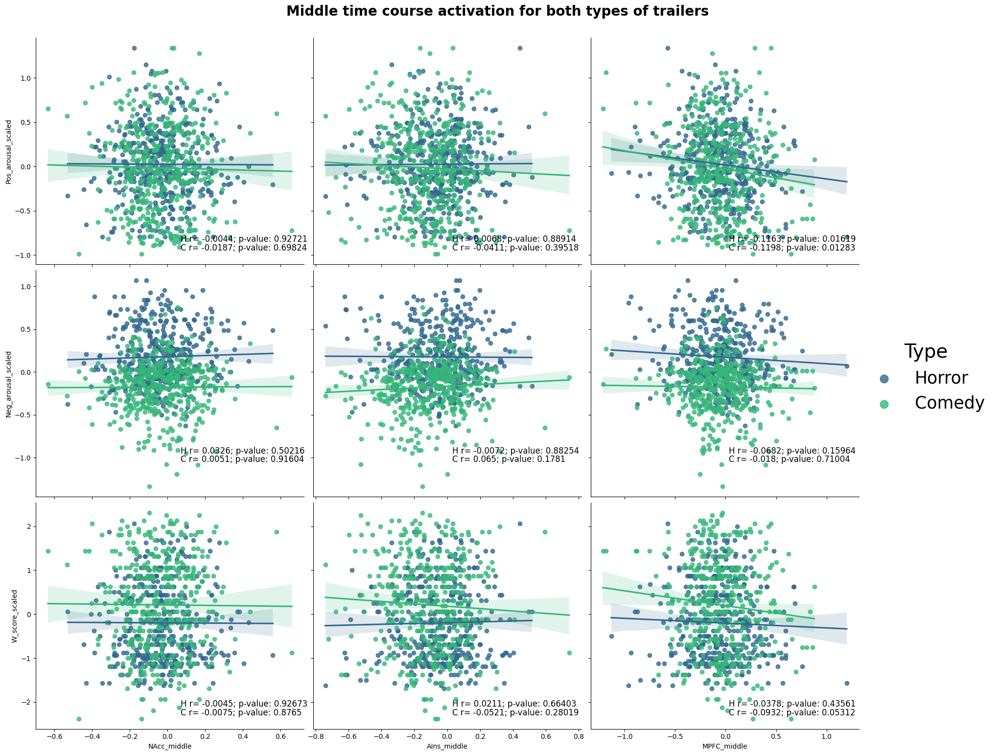

In [31]:
Mid_horror_corr = [NAcc_PA_Mid_H_corr, NAcc_NA_Mid_H_corr, NAcc_W_Mid_H_corr, AIns_PA_Mid_H_corr, AIns_NA_Mid_H_corr, AIns_W_Mid_H_corr, MPFC_PA_Mid_H_corr, MPFC_NA_Mid_H_corr, MPFC_W_Mid_H_corr]
Mid_comedy_corr = [NAcc_PA_Mid_C_corr, NAcc_NA_Mid_C_corr, NAcc_W_Mid_C_corr, AIns_PA_Mid_C_corr, AIns_NA_Mid_C_corr, AIns_W_Mid_C_corr, MPFC_PA_Mid_C_corr, MPFC_NA_Mid_C_corr, MPFC_W_Mid_C_corr]

title_middle = 'Middle time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "middle", Mid_comedy_corr, Mid_horror_corr, title_middle)

## Neural activation onset

In [32]:
# Correlation with Positive Arousal.
NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

For both types of trailers, the correlation between NAcc onset activation and positive arousal is: 0.01181 with a p-value of: 0.7298715856330581
For both types of trailers, the correlation between AIns onset activation and positive arousal is: 0.03996 with a p-value of: 0.24227780409485541
For both types of trailers, the correlation between MPFC onset activation and positive arousal is: 0.01929 with a p-value of: 0.572557485692752

For both types of trailers, the correlation between NAcc onset activation and negative arousal is: 0.00601 with a p-value of: 0.8605653403292475
For both types of trailers, the correlation between AIns onset activation and negative arousal is: 0.01613 with a p-value of: 0.637059875768812
For both types of trailers, the correlation between MPFC onset activation and negative arousal is: -0.02456 with a p-value of: 0.4724999688898952

For both types of trailers, the correlation between NAcc onset activation and watch scores is: 0.008 with a p-value of: 0.814906

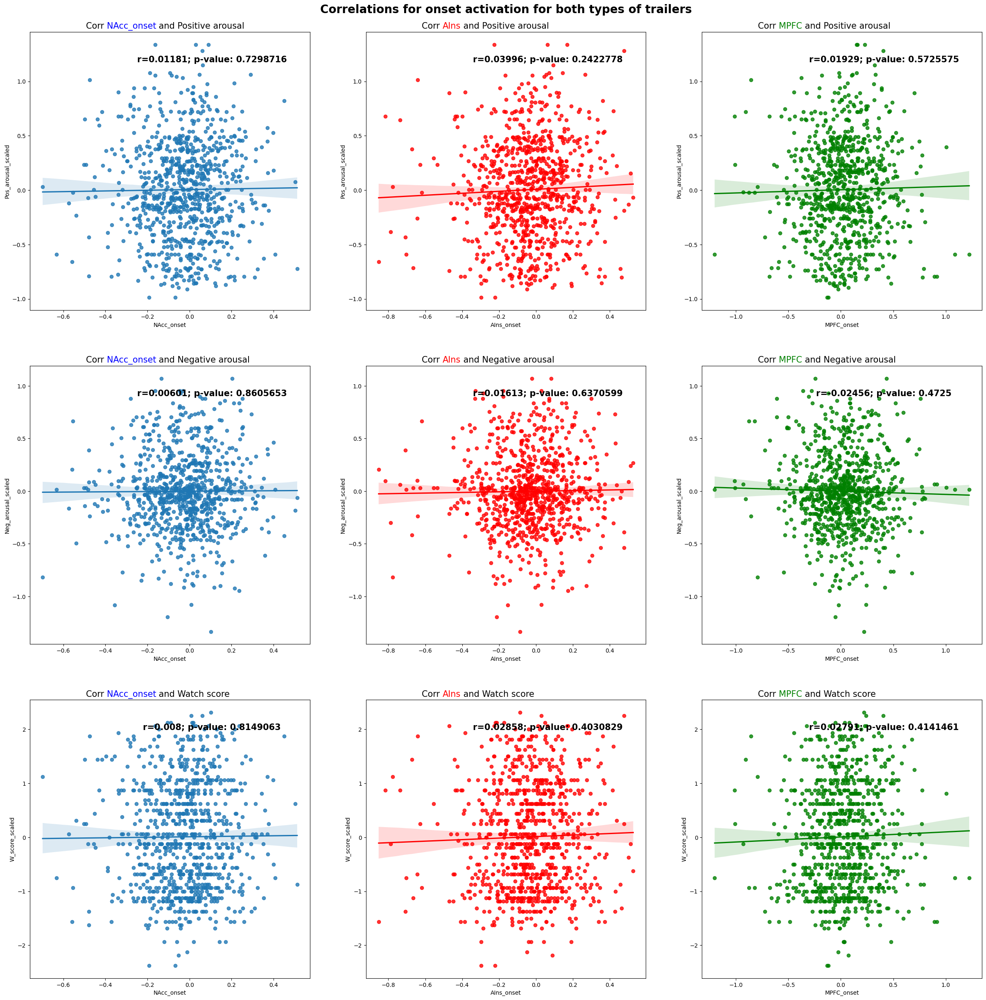

In [33]:
On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

In [34]:
# Onset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

For comedy trailers, the correlation between NAcc onset activation and positive arousal is: 0.05701 with a p-value of: 0.23757853496634743
For comedy trailers, the correlation between AIns onset activation and positive arousal is: 0.05648 with a p-value of: 0.24194753831508234
For comedy trailers, the correlation between MPFC onset activation and positive arousal is: -0.00019 with a p-value of: 0.996806756048271

For comedy trailers, the correlation between NAcc onset activation and negative arousal is: 0.02225 with a p-value of: 0.6451210639476676
For comedy trailers, the correlation between AIns onset activation and negative arousal is: 0.02285 with a p-value of: 0.6361673704680425
For comedy trailers, the correlation between MPFC onset activation and negative arousal is: 0.02989 with a p-value of: 0.5359900564768958

For comedy trailers, the correlation between NAcc onset activation and watch scores is: 0.03423 with a p-value of: 0.4785048210235837
For comedy trailers, the correlati

In [35]:
# Onset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

For horror trailers, the correlation between NAcc onset activation and positive arousal is: -0.04256 with a p-value of: 0.3803156112060546
For horror trailers, the correlation between AIns onset activation and positive arousal is: 0.0155 with a p-value of: 0.7493991826251408
For horror trailers, the correlation between MPFC onset activation and positive arousal is: 0.04813 with a p-value of: 0.3210529299732326

For horror trailers, the correlation between NAcc onset activation and negative arousal is: 0.00024 with a p-value of: 0.995985466686063
For horror trailers, the correlation between AIns onset activation and negative arousal is: -0.04217 with a p-value of: 0.3847091365671788
For horror trailers, the correlation between MPFC onset activation and negative arousal is: -0.029 with a p-value of: 0.5500341505086712

For horror trailers, the correlation between NAcc onset activation and watch scores is: -0.02671 with a p-value of: 0.5819893542991609
For horror trailers, the correlation

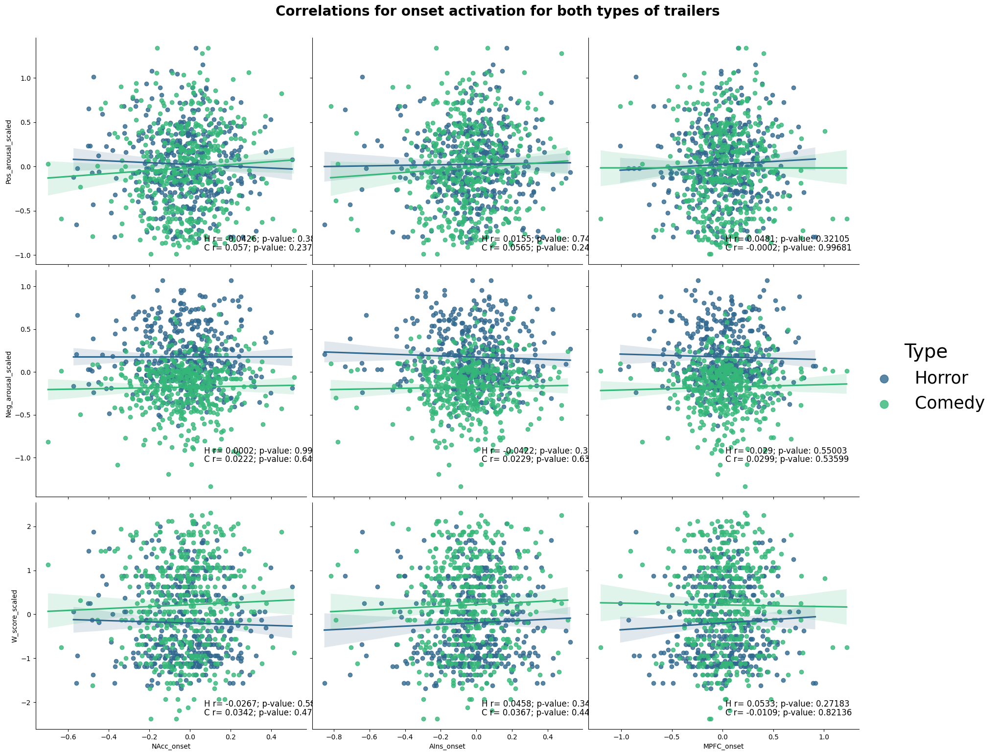

In [36]:
On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



## Peak Max

In [37]:
# Correlation with Positive Arousal.
NAcc_PA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_All_corr[1])))
      



For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.01311 with a p-value of: 0.701373379236352
For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: 0.01013 with a p-value of: 0.7670292786295015
For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.0491 with a p-value of: 0.15071664612518948

For both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.01789 with a p-value of: 0.6008472225106545
For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: 0.10882 with a p-value of: 0.0014111278458947005
For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.0023 with a p-value of: 0.9463392492067505

For both types of trailers, the correlation between NAcc positive peak activat

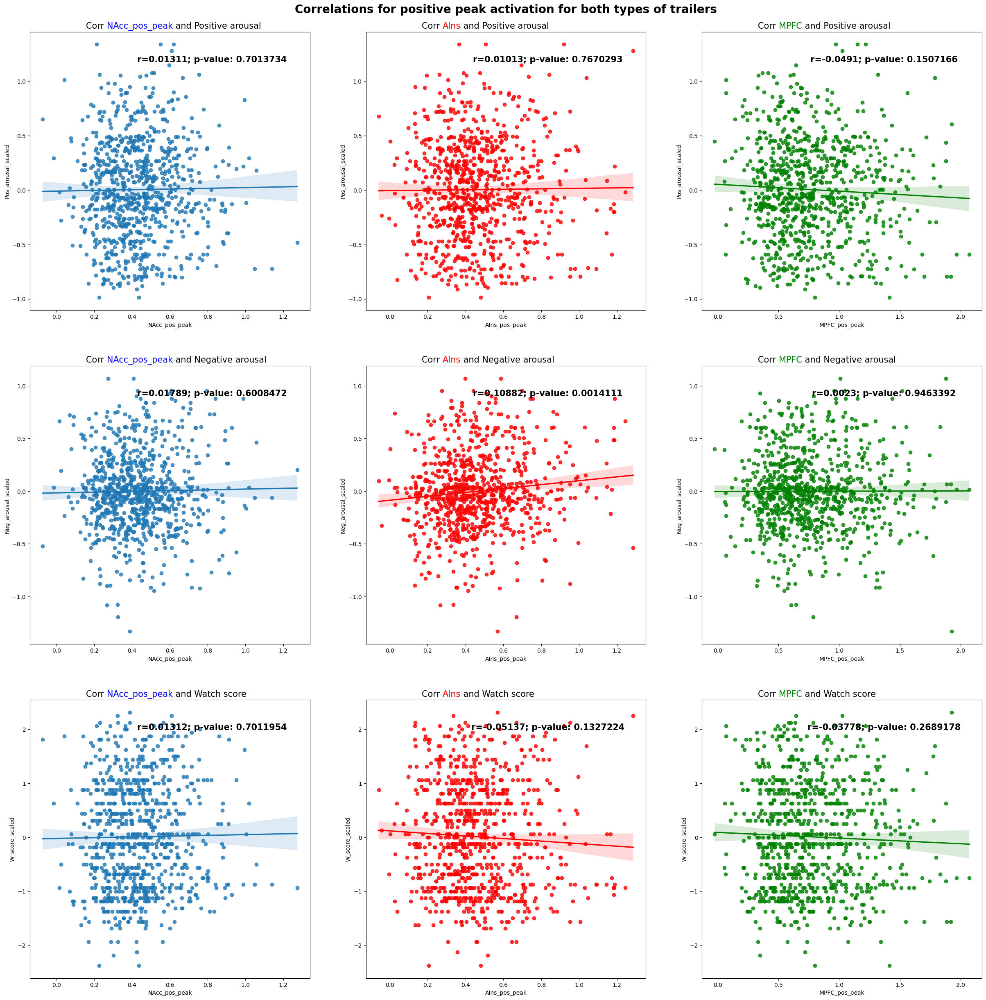

In [38]:
Pmax_all_corr = [NAcc_PA_Pmax_All_corr, NAcc_NA_Pmax_All_corr, NAcc_W_Pmax_All_corr, AIns_PA_Pmax_All_corr, AIns_NA_Pmax_All_corr, AIns_W_Pmax_All_corr, MPFC_PA_Pmax_All_corr, MPFC_NA_Pmax_All_corr, MPFC_W_Pmax_All_corr]
plot_correlations(all_subs_events_df, Pmax_all_corr, "pos_peak", "Correlations for positive peak activation for both types of trailers")


In [39]:
# Pos peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_C_corr[1])))
      
      


For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.03408 with a p-value of: 0.4804275389886634
For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: 0.00986 with a p-value of: 0.8383451233285694
For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.03828 with a p-value of: 0.42796886931561867

For comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: -0.06865 with a p-value of: 0.15481636957178077
For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: 0.01747 with a p-value of: 0.717680650860121
For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: -0.03051 with a p-value of: 0.5275346768913765

For comedy trailers, the correlation between NAcc positive peak activation and watch scores is: 0.07101 with a p-value

In [40]:
# Pos peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_H_corr[1])))


For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: -0.01267 with a p-value of: 0.7940659995690571
For horror trailers, the correlation between AIns positive peak activation and positive arousal is: -0.0 with a p-value of: 0.9999713863186568
For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.06037 with a p-value of: 0.21316284597408044

For horror trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.09335 with a p-value of: 0.053924538531727836
For horror trailers, the correlation between AIns positive peak activation and negative arousal is: 0.10782 with a p-value of: 0.025884228063027055
For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.06548 with a p-value of: 0.17685487269969266

For horror trailers, the correlation between NAcc positive peak activation and watch scores is: -0.05176 with a p-val

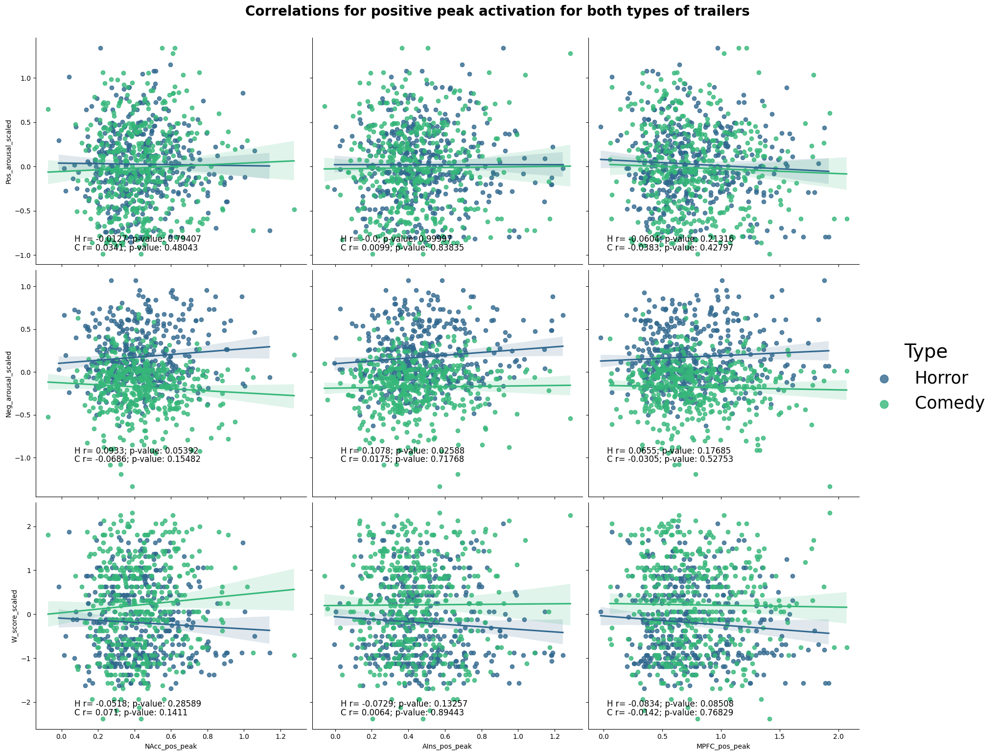

In [41]:
Pmax_comedy_corr = [NAcc_PA_Pmax_C_corr, NAcc_NA_Pmax_C_corr, NAcc_W_Pmax_C_corr, AIns_PA_Pmax_C_corr, AIns_NA_Pmax_C_corr, AIns_W_Pmax_C_corr, MPFC_PA_Pmax_C_corr, MPFC_NA_Pmax_C_corr, MPFC_W_Pmax_C_corr]
Pmax_horror_corr = [NAcc_PA_Pmax_H_corr, NAcc_NA_Pmax_H_corr, NAcc_W_Pmax_H_corr, AIns_PA_Pmax_H_corr, AIns_NA_Pmax_H_corr, AIns_W_Pmax_H_corr, MPFC_PA_Pmax_H_corr, MPFC_NA_Pmax_H_corr, MPFC_W_Pmax_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "pos_peak", Pmax_comedy_corr, Pmax_horror_corr, "Correlations for positive peak activation for both types of trailers")

## Peak min

In [42]:
# Correlation with Positive Arousal.
NAcc_PA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_All_corr[1])))
      
      

For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.05011 with a p-value of: 0.14248294730915537
For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: 0.0276 with a p-value of: 0.4194204121646636
For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.00967 with a p-value of: 0.7772127079248718

For both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.00087 with a p-value of: 0.9797859402685299
For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: 0.06805 with a p-value of: 0.04629917903579394
For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.04985 with a p-value of: 0.14460313322139962

For both types of trailers, the correlation between NAcc negative peak activ

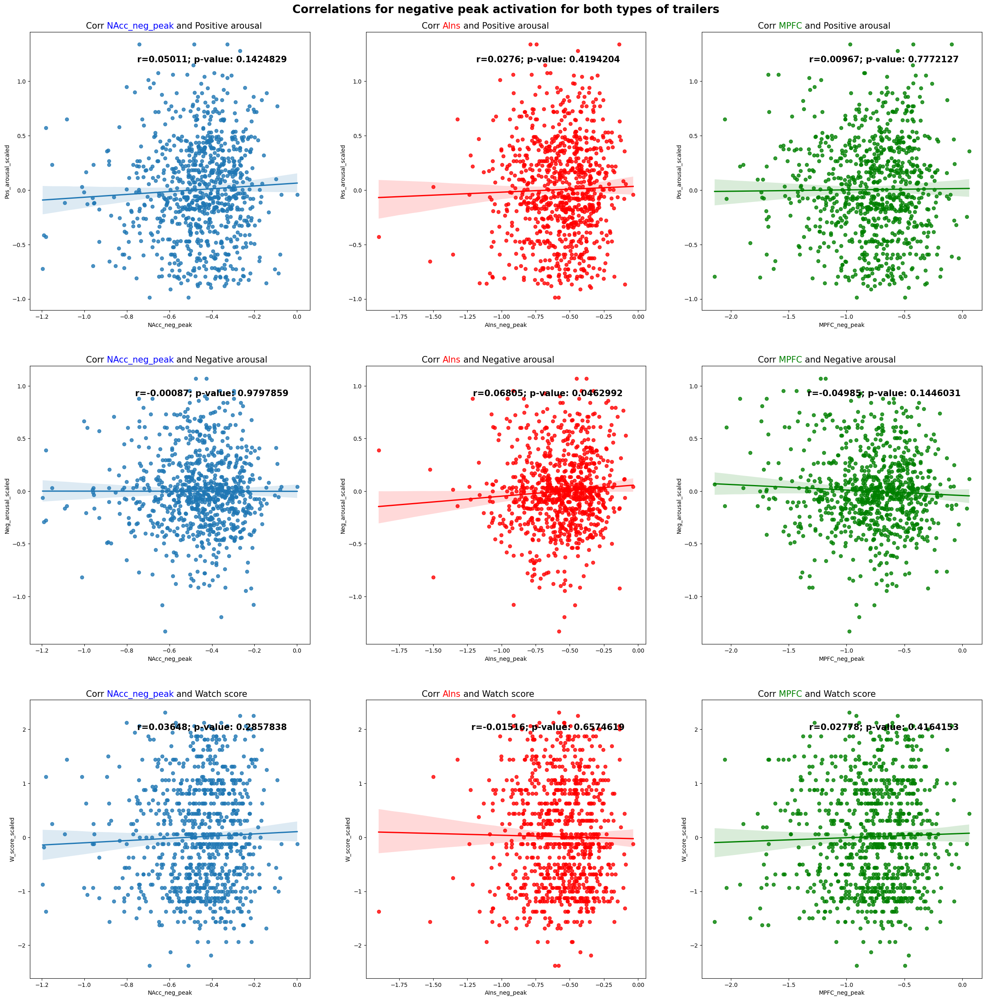

In [43]:
Pmin_all_corr = [NAcc_PA_Pmin_All_corr, NAcc_NA_Pmin_All_corr, NAcc_W_Pmin_All_corr, AIns_PA_Pmin_All_corr, AIns_NA_Pmin_All_corr, AIns_W_Pmin_All_corr, MPFC_PA_Pmin_All_corr, MPFC_NA_Pmin_All_corr, MPFC_W_Pmin_All_corr]
plot_correlations(all_subs_events_df, Pmin_all_corr, "neg_peak", "Correlations for negative peak activation for both types of trailers")

In [44]:
# Neg peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_C_corr[1])))


For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: -0.02705 with a p-value of: 0.5754567503420074
For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: -0.00423 with a p-value of: 0.9302996091941607
For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: -0.04436 with a p-value of: 0.3582337911421362

For comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: 0.09628 with a p-value of: 0.04574245242945262
For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: 0.08828 with a p-value of: 0.06710810133041338
For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: 0.03251 with a p-value of: 0.500889472481877

For comedy trailers, the correlation between NAcc negative peak activation and watch scores is: -0.0658 with a p-value

In [45]:
# Neg peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_H_corr[1])))
      

For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.14573 with a p-value of: 0.002539252435902699
For horror trailers, the correlation between AIns negative peak activation and positive arousal is: 0.05442 with a p-value of: 0.2618213918849673
For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.07403 with a p-value of: 0.12664982101440753

For horror trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.04174 with a p-value of: 0.3895837064642794
For horror trailers, the correlation between AIns negative peak activation and negative arousal is: -0.05145 with a p-value of: 0.28880137099334313
For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.13942 with a p-value of: 0.003894201905021039

For horror trailers, the correlation between NAcc negative peak activation and watch scores is: 0.13783 with a p-

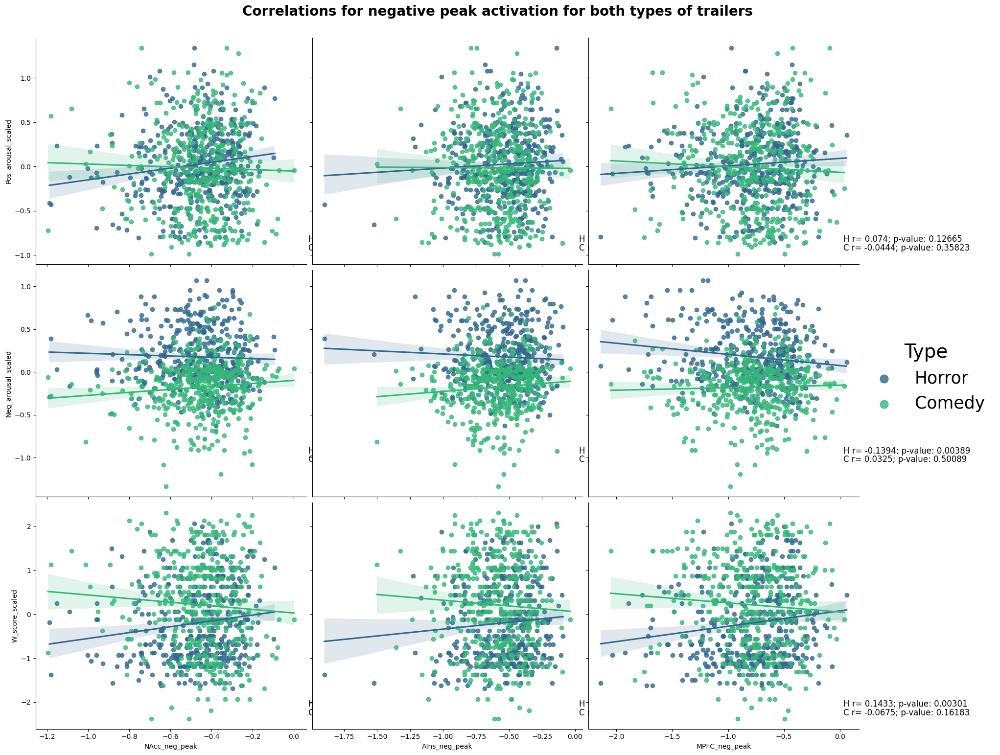

In [46]:
Pmin_comedy_corr = [NAcc_PA_Pmin_C_corr, NAcc_NA_Pmin_C_corr, NAcc_W_Pmin_C_corr, AIns_PA_Pmin_C_corr, AIns_NA_Pmin_C_corr, AIns_W_Pmin_C_corr, MPFC_PA_Pmin_C_corr, MPFC_NA_Pmin_C_corr, MPFC_W_Pmin_C_corr]
Pmin_horror_corr = [NAcc_PA_Pmin_H_corr, NAcc_NA_Pmin_H_corr, NAcc_W_Pmin_H_corr, AIns_PA_Pmin_H_corr, AIns_NA_Pmin_H_corr, AIns_W_Pmin_H_corr, MPFC_PA_Pmin_H_corr, MPFC_NA_Pmin_H_corr, MPFC_W_Pmin_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "neg_peak", Pmin_comedy_corr, Pmin_horror_corr, "Correlations for negative peak activation for both types of trailers")

## Absolute peak 

In [47]:
# Correlation with Positive Arousal.
NAcc_PA_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pabs_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pabs_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pabs_All_corr[1])))

      

For both types of trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.06281 with a p-value of: 0.0659037422365925
For both types of trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.03885 with a p-value of: 0.2556207788396034
For both types of trailers, the correlation between MPFC absolute peak activation and positive arousal is: 0.00478 with a p-value of: 0.88871215806778

For both types of trailers, the correlation between NAcc absolute peak activation and negative arousal is: -0.01488 with a p-value of: 0.6633224153498439
For both types of trailers, the correlation between AIns absolute peak activation and negative arousal is: 0.08565 with a p-value of: 0.012084755832577851
For both types of trailers, the correlation between MPFC absolute peak activation and negative arousal is: -0.03201 with a p-value of: 0.3489717183502691

For both types of trailers, the correlation between NAcc absolute peak activat

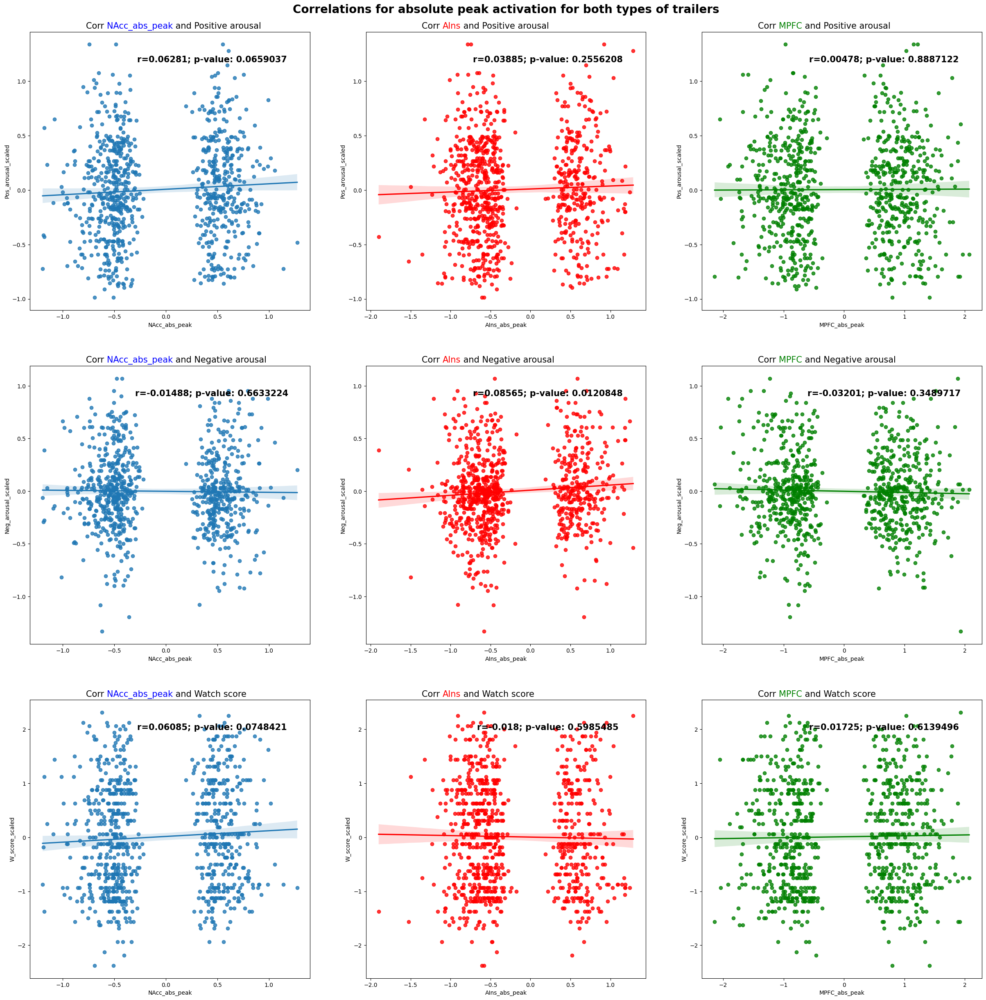

In [48]:
Pabs_all_corr = [NAcc_PA_Pabs_All_corr, NAcc_NA_Pabs_All_corr, NAcc_W_Pabs_All_corr, AIns_PA_Pabs_All_corr, AIns_NA_Pabs_All_corr, AIns_W_Pabs_All_corr, MPFC_PA_Pabs_All_corr, MPFC_NA_Pabs_All_corr, MPFC_W_Pabs_All_corr]
plot_correlations(all_subs_events_df, Pabs_all_corr, "abs_peak", "Correlations for absolute peak activation for both types of trailers")

In [49]:
NAcc_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Pabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Pabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Pabs_comedy_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Nabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Nabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Nabs_comedy_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Wabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Wabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Wabs_comedy_corr[1])))
      

For comedy trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.04219 with a p-value of: 0.38230487475557096
For comedy trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.03187 with a p-value of: 0.5093865774714497
For comedy trailers, the correlation between MPFC absolute peak activation and positive arousal is: -0.01778 with a p-value of: 0.712829139567506

For comedy trailers, the correlation between NAcc absolute peak activation and negative arousal is: -0.02794 with a p-value of: 0.5629951198245053
For comedy trailers, the correlation between AIns absolute peak activation and negative arousal is: 0.04553 with a p-value of: 0.345660670741605
For comedy trailers, the correlation between MPFC absolute peak activation and negative arousal is: 0.00013 with a p-value of: 0.9979339516065328

For comedy trailers, the correlation between NAcc absolute peak activation and watch scores is: 0.05038 with a p-value of

In [50]:
NAcc_Pabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_Pabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_Pabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_Nabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_Nabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_Nabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_Wabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["W_score_scaled"])
AIns_Wabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_Wabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Pabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Pabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Pabs_horror_corr[1])))

print("\nFor horror trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Nabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Nabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Nabs_horror_corr[1])))

print("\nFor horror trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Wabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Wabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Wabs_horror_corr[1])))

For horror trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.09179 with a p-value of: 0.05805793989596175
For horror trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.03509 with a p-value of: 0.4696064237492085
For horror trailers, the correlation between MPFC absolute peak activation and positive arousal is: 0.03263 with a p-value of: 0.50124141275093

For horror trailers, the correlation between NAcc absolute peak activation and negative arousal is: 0.02381 with a p-value of: 0.6237487052137881
For horror trailers, the correlation between AIns absolute peak activation and negative arousal is: 0.00435 with a p-value of: 0.9285128439753944
For horror trailers, the correlation between MPFC absolute peak activation and negative arousal is: -0.07395 with a p-value of: 0.1270875543890455

For horror trailers, the correlation between NAcc absolute peak activation and watch scores is: 0.0636 with a p-value of: 

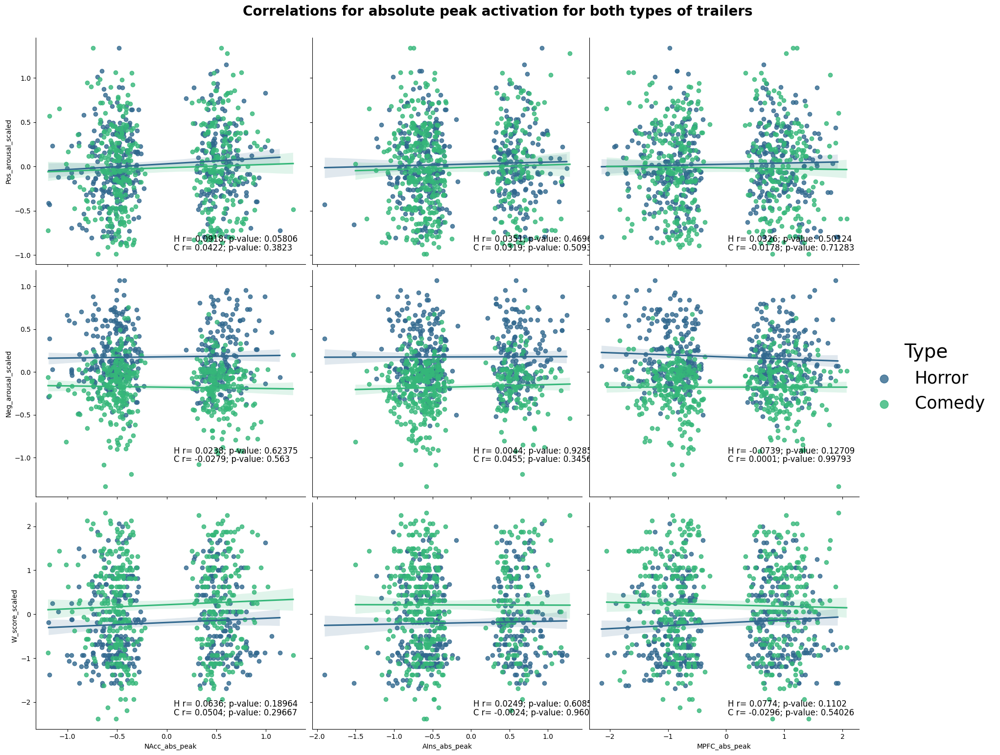

In [51]:
Pabs_comedy_corr = [NAcc_Pabs_comedy_corr, NAcc_Nabs_comedy_corr, NAcc_Wabs_comedy_corr, AIns_Pabs_comedy_corr, AIns_Nabs_comedy_corr, AIns_Wabs_comedy_corr, MPFC_Pabs_comedy_corr, MPFC_Nabs_comedy_corr, MPFC_Wabs_comedy_corr]
Pabs_horror_corr = [NAcc_Pabs_horror_corr, NAcc_Nabs_horror_corr, NAcc_Wabs_horror_corr, AIns_Pabs_horror_corr, AIns_Nabs_horror_corr, AIns_Wabs_horror_corr, MPFC_Pabs_horror_corr, MPFC_Nabs_horror_corr, MPFC_Wabs_horror_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "abs_peak", Pabs_comedy_corr, Pabs_horror_corr, "Correlations for absolute peak activation for both types of trailers")

## Neural ISC

In [52]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.05079 with a p-value of: 0.1371217084245802
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.02732 with a p-value of: 0.42408636182415355
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.10637 with a p-value of: 0.0018088617978307814

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.05463 with a p-value of: 0.10980956660646964
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.04609 with a p-value of: 0.17740715896480566
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: -0.03204 with a p-value of: 0.3485723577664251

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.07296 with a p-value of: 0.032613102

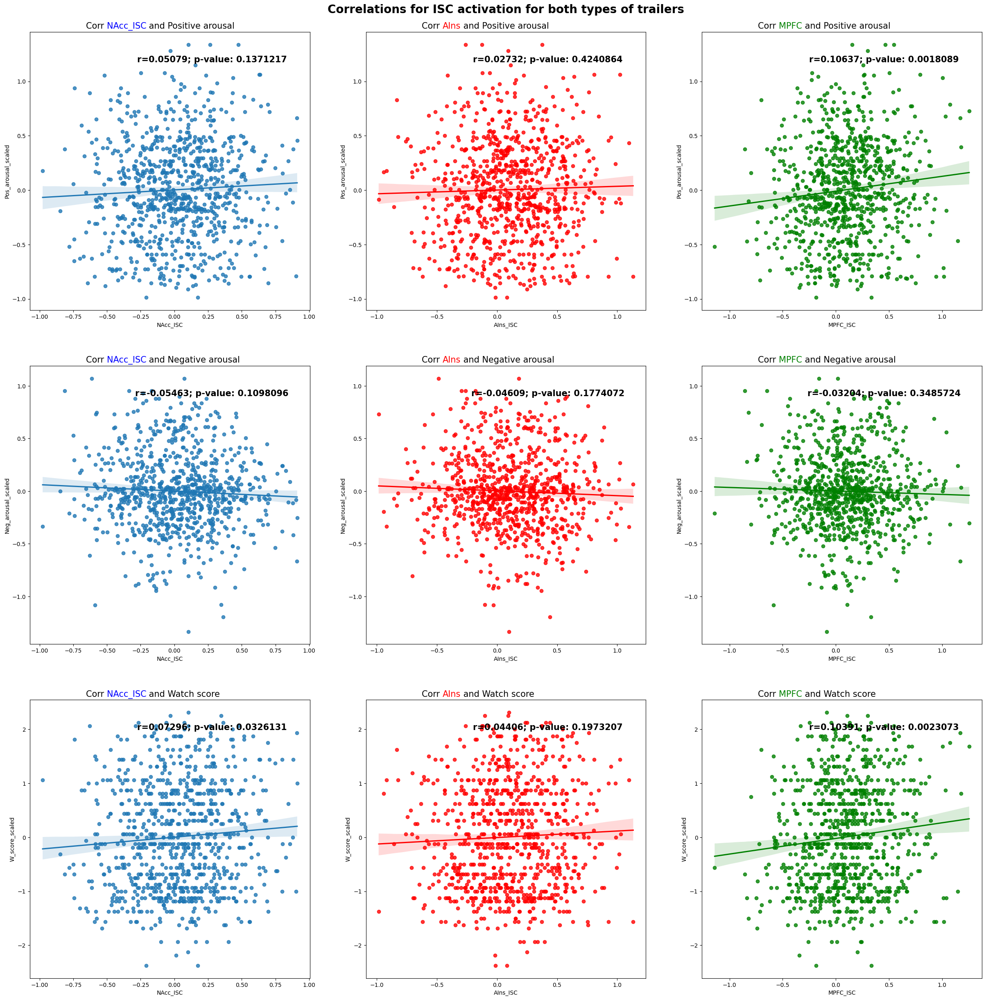

In [53]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [54]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.12524 with a p-value of: 0.00924952560270102
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.12215 with a p-value of: 0.01114873750945239
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.14663 with a p-value of: 0.002274494864969252

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.01231 with a p-value of: 0.7988174624311749
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.06725 with a p-value of: 0.1633950053346494
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: -0.00088 with a p-value of: 0.9854361025085389

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.11039 with a p-value of: 0.021901221755425113
For comedy trailers, the correlation betw

In [55]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.04301 with a p-value of: 0.37528158594182665
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.08227 with a p-value of: 0.08952552374284214
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.05919 with a p-value of: 0.22222185160570426

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.10148 with a p-value of: 0.03605525719311143
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.01928 with a p-value of: 0.6911112376291336
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: -0.06106 with a p-value of: 0.20796888875186118

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.02537 with a p-value of: 0.6011264304893162
For horror trailers, the correlation betw

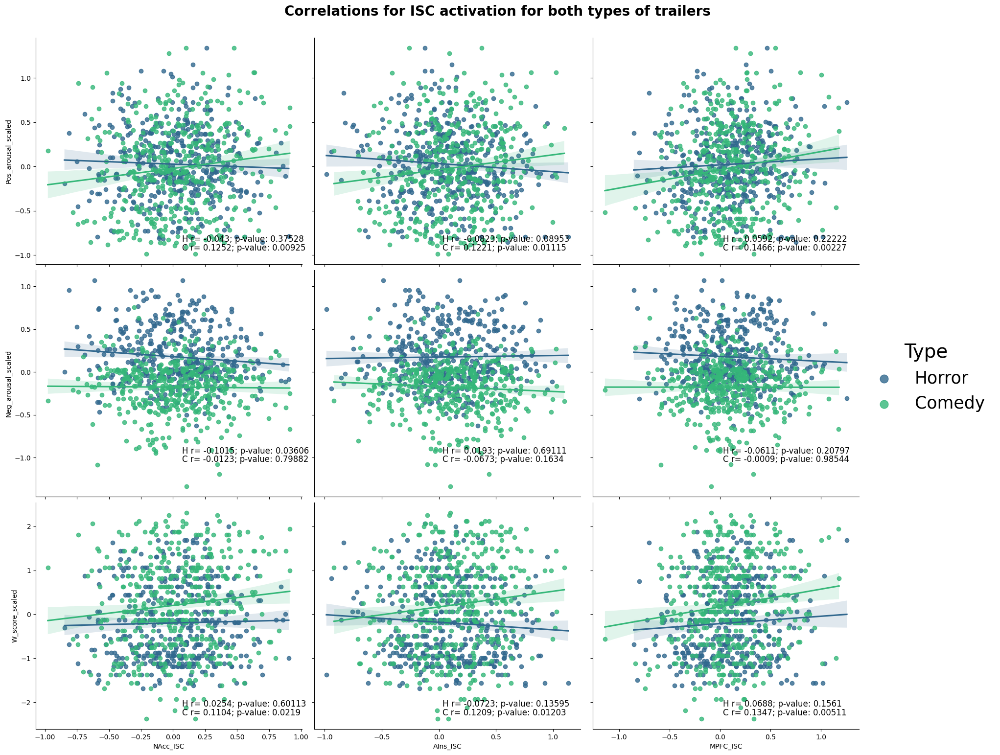

In [56]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


In [57]:
"""
# Not used. 
def corrfunc(x, y, **kws):
    print(x)
    r, _ = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9
"""

'\n# Not used. \ndef corrfunc(x, y, **kws):\n    print(x)\n    r, _ = pearsonr(x, y)\n    ax = plt.gca()\n    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9\n'